In [4]:
import h5py
import scanpy as sc
import scipy
import mira
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats

In [5]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

In [74]:
del adata

In [75]:
adata = sc.read_h5ad("/media/RAIDArray/JingyuFan/projects/human_B_cell/scRNA_220830/human_B_cell_scRNA_seq_220831/outs/human_B_cell_scRNA_seq_230327.umap.leiden_clusters.h5ad")
adata

AnnData object with n_obs × n_vars = 25237 × 20921
    obs: 'Classification', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'topic_0', 'topic_1', 'topic_2', 'topic_3', 'topic_4', 'topic_5', 'topic_6', 'topic_7', 'topic_8', 'topic_9', 'topic_10', 'topic_11', 'topic_12', 'topic_13', 'topic_14', 'topic_15', 'topic_16', 'topic_17', 'topic_18', 'topic_19', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'exog', 'endog'
    uns: 'Classification_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'topic_dendogram', 'umap'
    obsm: 'X_topic_compositions', 'X_umap', 'X_umap_features'
    varm: 'topic_feature_activations', 'topic_feature_compositions'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

# prepare for visualization

In [6]:
adata_steve = sc.read_h5ad("/media/RAIDArray/Nick/projects/human_Bcell_GRN/donor1_upmc_scRNAseq/h5_files/scRNA_male_scimilarity_corrected.h5ad")
adata_steve

AnnData object with n_obs × n_vars = 25237 × 1765
    obs: 'Classification', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'topic_0', 'topic_1', 'topic_2', 'topic_3', 'topic_4', 'topic_5', 'topic_6', 'topic_7', 'topic_8', 'topic_9', 'topic_10', 'topic_11', 'topic_12', 'topic_13', 'topic_14', 'topic_15', 'topic_16', 'topic_17', 'topic_18', 'topic_19', 'leiden', 'Tag', 'SVM', 'Scim', 'predicted_labels', 'prob_Activated NBC', 'prob_GCBC', 'prob_MBC', 'prob_NBC', 'prob_PC'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'exog', 'endog'
    uns: 'Classification_colors', 'SVM_colors', 'Scim_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'predicted_labels_colors', 'topic_dendogram', 'umap'
    obsm: 'X_topic_compositions', 'X_umap', 'X_umap_features'
    varm: 'topic_feature_activati

In [76]:
if 'adata' in locals() and 'adata_steve' in locals():
    # Ensure both have the same index type
    adata_steve.obs.index = adata_steve.obs.index.astype(str)
    adata.obs.index = adata.obs.index.astype(str)

    # Select columns to copy
    columns_to_copy = ['Scim', 'predicted_labels', 'prob_Activated NBC', 'prob_GCBC', 'prob_MBC', 'prob_NBC', 'prob_PC']

    # Perform the merge based on index
    adata.obs = adata.obs.merge(
        adata_steve.obs[columns_to_copy], 
        left_index=True, 
        right_index=True, 
        how='left'
    )

else:
    print("❌ Error: `adata` and/or `adata_steve` are not defined. Please load them before running the code.")

In [77]:
adata

AnnData object with n_obs × n_vars = 25237 × 20921
    obs: 'Classification', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'topic_0', 'topic_1', 'topic_2', 'topic_3', 'topic_4', 'topic_5', 'topic_6', 'topic_7', 'topic_8', 'topic_9', 'topic_10', 'topic_11', 'topic_12', 'topic_13', 'topic_14', 'topic_15', 'topic_16', 'topic_17', 'topic_18', 'topic_19', 'leiden', 'Scim', 'predicted_labels', 'prob_Activated NBC', 'prob_GCBC', 'prob_MBC', 'prob_NBC', 'prob_PC'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'exog', 'endog'
    uns: 'Classification_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'topic_dendogram', 'umap'
    obsm: 'X_topic_compositions', 'X_umap', 'X_umap_features'
    varm: 'topic_feature_activations', 'topic_feature_compositions'
    layers: 'counts'
    obsp: 'co

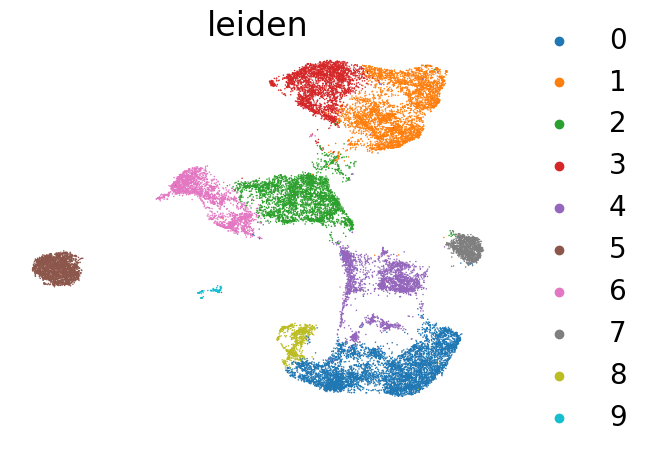

In [78]:
sc.pl.umap(
    adata,
    frameon=False,
    color=['leiden']
)

In [79]:
filter_leiden = ~adata.obs['leiden'].isin(["7", "9"])
filter_class = ~adata.obs['Classification'].isin(["Doublet", "Negative"])
adata.obs['leiden_filtered_cells'] = filter_leiden & filter_class
adata.obs['leiden_filtered_cells'].value_counts()

leiden_filtered_cells
True     19285
False     5952
Name: count, dtype: int64

In [80]:
adata = adata[adata.obs['leiden_filtered_cells']].copy()

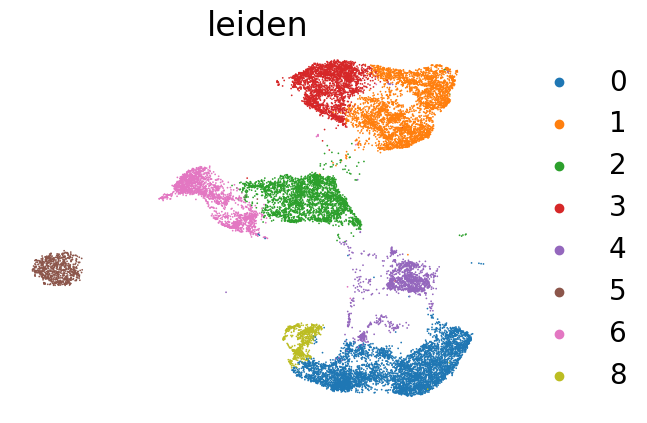

In [81]:
sc.pl.umap(
    adata,
    frameon=False,
    color=['leiden']
)

In [82]:
sc.pp.neighbors(adata, use_rep = 'X_umap_features', metric = 'manhattan',n_neighbors=20)

In [83]:
#adjust clustering
sc.tl.leiden(adata,resolution=0.2,random_state=6, key_added="leiden", flavor="leidenalg")

In [84]:
adata.uns['leiden_colors'] = ['firebrick', 'green', 'lightskyblue', 'mediumorchid', 'lightcoral', 'gray']

In [85]:
adata.obs.rename(columns={'Classification': 'sample'}, inplace=True)

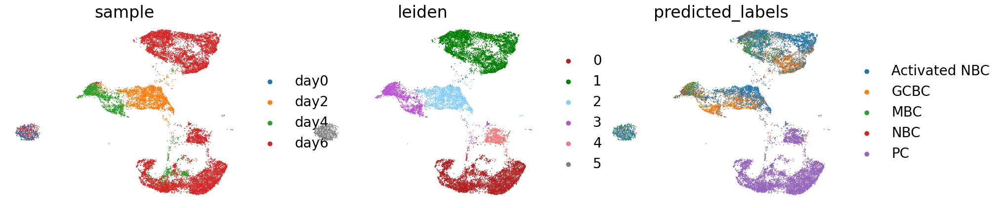

In [86]:
sc.pl.umap(
    adata,
    frameon=False,
    color=['sample','leiden','predicted_labels']
)

In [87]:
# Define the mapping dictionary
cell_type_mapping = {
    0: "PB",
    1: "GCBC",
    2: "ActB-D2",
    3: "ActB-D4",
    4: "earlyPB",
    5: "Naive"
}

# Apply the mapping while handling NaN values
adata.obs['cell_type_annotation'] = adata.obs['leiden'].map(lambda x: cell_type_mapping.get(int(x), np.nan) if pd.notna(x) else np.nan)

In [88]:
# Unique names in adata.obs['Scim']
unique_scim_names = adata.obs['Scim'].unique()

# Define a mapping of names to colors
scim_color_map = {
    'plasma cell': 'firebrick',  # Red
    'plasmablast': 'firebrick',  # Green
    'germinal center B cell': 'green',  # Blue
    'memory B cell': 'peru',
    'naive B cell': 'gray'
    # Add more mappings as needed
}

# Check if all names have been assigned a color
missing_colors = set(unique_scim_names) - set(scim_color_map.keys())
if missing_colors:
    print(f"Warning: Colors not assigned to the following names: {missing_colors}")

scim_categories = adata.obs['Scim'].cat.categories
scim_colors = [scim_color_map[name] for name in scim_categories]
adata.uns['Scim_colors'] = scim_colors

adata.obs['Scim'].unique()

['germinal center B cell', 'memory B cell', 'plasmablast', 'naive B cell', 'plasma cell']
Categories (5, object): ['germinal center B cell', 'memory B cell', 'naive B cell', 'plasma cell', 'plasmablast']

In [89]:
# Unique names in adata.obs['Scim']
unique_class_names = adata.obs['sample'].unique()

# Define a mapping of names to colors
class_color_map = {
    'day0': '#273746',  # Red
    'day2': '#f1c40f',  # Green
    'day4': '#3498db',  # Blue
    'day6': '#9b59b6',
    # Add more mappings as needed
}

# Check if all names have been assigned a color
missing_colors = set(unique_class_names) - set(class_color_map.keys())
if missing_colors:
    print(f"Warning: Colors not assigned to the following names: {missing_colors}")

In [90]:
class_categories = adata.obs['sample'].cat.categories
class_colors = [class_color_map[name] for name in class_categories]
adata.uns['sample_colors'] = class_colors

# gene scores

<Axes: title={'center': 'prob_GCBC'}, xlabel='UMAP1', ylabel='UMAP2'>

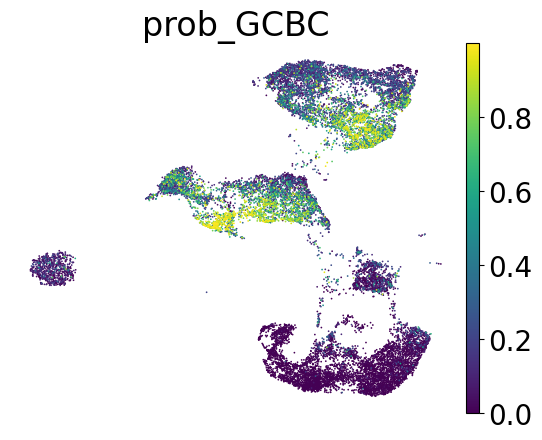

In [91]:
sc.pl.umap(
    adata,
    legend_loc=False,
    show=False,
    frameon=False,
    color=['prob_GCBC']
)


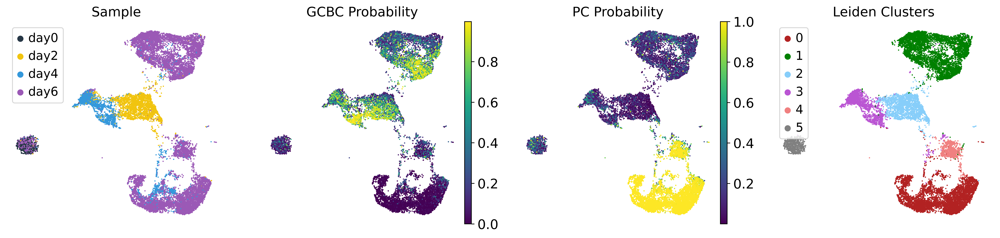

In [93]:
import matplotlib.pyplot as plt
sc.set_figure_params(dpi=300, fontsize=15)
background_size = 8

# Create a Matplotlib figure with two subplots side by side
fig, axs = plt.subplots(1, 4, figsize=(16, 4))

# Plot the second UMAP for bifurcated example clonotype
sc.pl.umap(
    adata,
    ax=axs[0],
    s=background_size,
    legend_loc=False,
    show=False,
    frameon=False,
    color=['sample']
)
axs[0].set_title("Sample")

# Plot the background UMAP
sc.pl.umap(
    adata,
    ax=axs[1],
    s=background_size,
    legend_loc=False,
    cmap = 'viridis',
    show=False,
    frameon=False,
    color='prob_GCBC'
)
axs[1].set_title("GCBC Probability")

# Plot the background UMAP

sc.pl.umap(
    adata,
    ax=axs[2],
    s=background_size,
    legend_loc=False,
    cmap = 'viridis',
    show=False,
    frameon=False,
    color='prob_PC'
)
axs[2].set_title("PC Probability")

# Plot the second UMAP for GC-only example clonotype
sc.pl.umap(
    adata,
    ax=axs[3],
    s=background_size,
    legend_loc=False,
    show=False,
    frameon=False,
    color=['leiden']
)
axs[3].set_title("Leiden Clusters")

# Adjust layout: Increase horizontal spacing
plt.subplots_adjust(wspace=0.4)  # Increase spacing between subplots

# Save the figure as a PDF
plt.tight_layout()
#plt.savefig("/media/RAIDArray/Nick/projects/human_Bcell_GRN/donor1_upmc_scRNAseq/plots/sample_tonsil_probality_leiden_umap.pdf")
plt.show()

In [3]:
df_temp=pd.read_excel('/ix/djishnu/peasena/gene_sets/PB marker gene King et al 2021.xlsx')
list_PB= df_temp['gene'].unique().tolist()

df_temp=pd.read_excel('/ix/djishnu/peasena/gene_sets/LZ GC markers.xlsx')
list_LZ_GC= df_temp['Unnamed: 6'].unique().tolist()

df_temp=pd.read_excel('/ix/djishnu/peasena/gene_sets/DZ GC markers.xlsx')
list_DZ_GC= df_temp['gene'].unique().tolist()

list_total_GC = list_LZ_GC+list_DZ_GC

In [4]:
list_g1s=['CDCA7','MCM4','MCM2','RFC2','UNG','MCM6','RRM1','SLBP','PCNA','ATAD2','TIPIN','MCM5','UHRF1','RPA2','DTL','PRIM1','FEN1','HELLS','GMNN','POLD3','NASP','CHAF1B','GINS2','POLA1','MSH2','CASP8AP2','CDC6','UBR7','CCNE2','WDR76','TYMS','CDC45','CLSPN','RRM2','DSCC1','RAD51','USP1','EXO1','BLM','RAD51AP1','CENPU','E2F8','BRIP1']
list_g2m=['CBX5','AURKB','CKS1B','CKS2','JPT1','HMGB2','ANP32E','LBR','TMPO','TOP2A','TACC3','TUBB4B','NCAPD2','RANGAP1','CDK1','SMC4','KIF20B','CDCA8','CKAP2','NDC80','DLGAP5','HJURP','CKAP5','BUB1','CKAP2L','ECT2','KIF11','BIRC5','CDCA2','NUF2','CDCA3','NUSAP1','TTK','AURKA','MKI67','PIMREG','CCNB2','TPX2','ANLN','KIF2C','CENPE','GTSE1','KIF23','CDC20','UBE2C','CENPF','CENPA','HMMR','CTCF','PSRC1','CDC25C','NEK2','GAS2L3','G2E3']
list_myc_up=['NARS','NUFIP1','NUP43','SLC19A1','NCL','EXOSC7','SURF2','PSMG1','METTL1','AEN','1110004E09RIK','LYAR','PSME3','TSR1','SHMT1','BCAT1','CCND2','NDUFAF4','SLC40A1','HEATR3','AIMP2','TTC27','FAM136A','VCAM1','CCND2','NOP56','C1QA','MKI67IP','AIMP2','PLSCR1','RRP1B','MFSD2A','CIRH1A','C1QB','MRTO4','CCND2','WDR75','HSP90AA1','GCSH','FAM195A','TIMM10','FABP5','SRM','C1QC','2610528E23RIK','LOC100047619','CCND2','SAA3','UTP15','ATIC','SHMT1','THYN1','2700023E23RIK','DDX18','IL1R2','TIMM9','CSDA','RCL1','GRWD1','NOLC1','GM12816','RPF2','1810029B16RIK','GSTT1','TSR1','TOMM5','CCT6A','NHP2','CHCHD4','MOGS','IRF4','FSCN1','GM7901','SLC19A1','PLSCR1','PA2G4','HSPD1','LOC100047009','EBNA1BP2','PHB','MATR3','GAR1','RCC1','NOP58','SLC19A1','GNL3','TSEN2','NDUFAF4','EMR4','GSTT2','SLPI','ABCG2','NOP16','PPP1R14B','LAP3','PRDX6','SHMT2','PPP1R14B','GM14005','NOLC1','LPL','MATR3','WDR12','BATF','C1QBP','---','1110004E09RIK','CCND2','UCK2','SPIRE1','LOC100048307','HTRA2','DDX18','PSMD7','TUBA4A','2610201A13RIK','CCND2','NOC4L','RPP40','ASNS','LYZ1','RANGRF','SUB1','ENDOG','DCTD','BSN','RSL1D1','NT5DC2','NHP2','2010204K13RIK','FAM185A','PECR','UCK2','SOCS3','ACY1','ZMYND19','SOCS3','PRMT1','SMYD2','FABP5','FBL','GRWD1','DDT','PNO1','CCND2','PA2G4','GRWD1','APRT','HK2','CCDC86','ECE2','APEX1','SOCS2','ZNHIT6','ATAD3A','HSPA9','TIMD2','PPA1','MIF','CTPS','APEX1','MRPS18B','IL10','METTL1','TUBA4A','NCL','NOP16','MRPS6','HSP90B1','TCFAP4','EIF2B3','SHMT1','RANBP1','ASNS','GSR','NOC4L','DCTPP1','LOC639633','2610019E17RIK','UCK2','ADM','TMEM158','CD70','POLR1B','MYC','C1QBP','PPAT','PYCR1','SPR']

In [6]:
sc.tl.score_genes(adata, 
                   list_total_GC, 
                   ctrl_size=300, 
                   gene_pool=None, 
                   n_bins=25, 
                   score_name='score_total_GC', 
                   random_state=6, 
                   copy=False, 
                   use_raw=False)

sc.tl.score_genes(adata, 
                   list_PB, 
                   ctrl_size=300, 
                   gene_pool=None, 
                   n_bins=25, 
                   score_name='score_PB', 
                   random_state=6, 
                   copy=False, 
                   use_raw=False)

sc.tl.score_genes(adata, 
                   list_LZ_GC, 
                   ctrl_size=300, 
                   gene_pool=None, 
                   n_bins=25, 
                   score_name='score_LZ_GC', 
                   random_state=6, 
                   copy=False, 
                   use_raw=False)

sc.tl.score_genes(adata, 
                   list_DZ_GC, 
                   ctrl_size=300, 
                   gene_pool=None, 
                   n_bins=25, 
                   score_name='score_DZ_GC', 
                   random_state=6, 
                   copy=False, 
                   use_raw=False)


       'RAB30-AS1', 'MGEA5'],
      dtype='object')


In [7]:
sc.tl.score_genes(adata, 
                   list_g1s, 
                   ctrl_size=300, 
                   gene_pool=None, 
                   n_bins=25, 
                   score_name='score_G1S', 
                   random_state=6, 
                   copy=False, 
                   use_raw=False)


sc.tl.score_genes(adata, 
                   list_g2m, 
                   ctrl_size=300, 
                   gene_pool=None, 
                   n_bins=25, 
                   score_name='score_G2M', 
                   random_state=6, 
                   copy=False, 
                   use_raw=False)


sc.tl.score_genes(adata, 
                   list_myc_up, 
                   ctrl_size=300, 
                   gene_pool=None, 
                   n_bins=25, 
                   score_name='score_myc_up', 
                   random_state=6, 
                   copy=False, 
                   use_raw=False)



       'FAM195A', 'C1QC', '2610528E23RIK', 'LOC100047619', 'SAA3',
       '2700023E23RIK', 'CSDA', 'GM12816', '1810029B16RIK', 'GSTT1', 'GM7901',
       'LOC100047009', 'EMR4', 'GSTT2', 'SLPI', 'GM14005', '---',
       'LOC100048307', '2610201A13RIK', 'LYZ1', '2010204K13RIK', 'ECE2',
       'TIMD2', 'CTPS', 'TCFAP4', 'LOC639633', '2610019E17RIK'],
      dtype='object')


In [8]:
gene_set = ['score_myc_up', 'score_G1S', 'score_G2M', 'mean_CDKN', 'score_LZ_GC', 'score_PB' ]

sc.set_figure_params(dpi=300, fontsize=15)
sns.set(rc={'figure.figsize':(6,6)})

sc.pl.umap(adata, 
           color=gene_set,
           color_map='inferno',
           legend_loc='on data',
           frameon = False,
           show = False,
           ncols = 5,
           s = 20
           #save="gene_signature_GC_PB_MBC.pdf"
          )

plt.savefig("/ix/cigcore/peasena/scrnaseq/human_B_cell_scRNA_seq_220831/plots/gene_scores.pdf")

# Marker gene analysis

In [97]:
sc.tl.rank_genes_groups(adata, 'cell_type_annotation', method='t-test_overestim_var',use_raw=False,pts=True)

In [98]:
ranked_genes_df = sc.get.rank_genes_groups_df(adata, group=None, key="rank_genes_groups")


In [ ]:
ranked_genes_df[ranked_genes_df['scores'].abs()>10].to_csv("/media/RAIDArray/Nick/projects/human_Bcell_GRN/donor1_upmc_scRNAseq/tables/leiden_ranked_genes.csv",header=True,index=False)


In [99]:
adata.obs['cell_type_annotation'].unique()

['GCBC', 'ActB-D4', 'PB', 'ActB-D2', 'Naive', 'earlyPB']
Categories (6, object): ['PB', 'GCBC', 'ActB-D2', 'ActB-D4', 'earlyPB', 'Naive']

In [100]:
# Select only the desired Leiden clusters
selected_clusters = ['Naive', 'ActB-D2', 'ActB-D4', 'GCBC', 'earlyPB', 'PB']
adata_subset = adata[adata.obs['cell_type_annotation'].isin(selected_clusters)]

# Define the desired order of clusters
cluster_order = ['Naive', 'ActB-D2', 'ActB-D4', 'GCBC', 'earlyPB', 'PB']

# Set the order in the 'leiden' column
adata_subset.obs['cell_type_annotation'] = adata_subset.obs['cell_type_annotation'].astype('category')
adata_subset.obs['cell_type_annotation'] = adata_subset.obs['cell_type_annotation'].cat.reorder_categories(cluster_order)



/tmp/ipykernel_23239/2800009569.py:9: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_subset.obs['cell_type_annotation'] = adata_subset.obs['cell_type_annotation'].astype('category')


{'mainplot_ax': <Axes: >,
 'gene_group_ax': <Axes: >,
 'size_legend_ax': <Axes: title={'center': 'Fraction of cells\nin group (%)'}>,
 'color_legend_ax': <Axes: title={'center': 'Mean expression\nin group'}>}

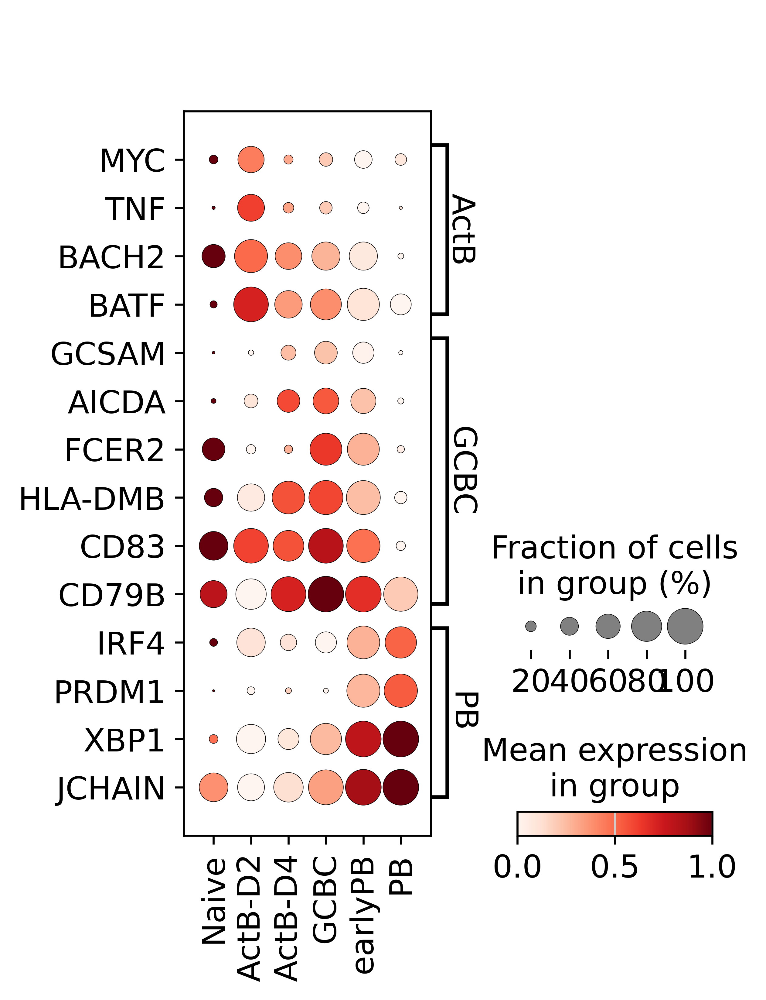

In [102]:
import logging
logging.getLogger('fontTools.subset').setLevel(logging.ERROR)


marker_genes_dict = {
    "ActB": ["MYC", "TNF", "BACH2", "BATF"],
    "GCBC": ["GCSAM", "AICDA", "FCER2", "HLA-DMB","CD83", "CD79B"],
    "PB": ["IRF4","PRDM1", "XBP1", "JCHAIN"]
}

# Generate the dotplot
sc.pl.dotplot(
    adata_subset,
    marker_genes_dict,
    groupby='cell_type_annotation',
    use_raw=False,
    cmap='Reds',
    standard_scale='var',
    mean_only_expressed=True,
    swap_axes=True,
    var_group_labels=None,
    show=False  # Prevent the plot from being displayed immediately
)

#plt.savefig("/media/RAIDArray/Nick/projects/human_Bcell_GRN/donor1_upmc_scRNAseq/plots/leiden_markergene_dotplot.pdf")